# Tutorial 7: Electromagnetic Wave Propagation Simulation

In this tutorial, we will explore the simulation of electromagnetic wave propagation using the Finite-Difference Time-Domain (FDTD) method. We will implement a 2D simulation of transverse magnetic (TM) mode waves in free space and various material structures. The simulation will include the propagation of electric and magnetic fields, as well as the interaction with dielectric blocks and waveguides.

In differential form, Maxwell's equations are:
1. ∇ × E = -∂B/∂t      (Faraday's law)
2. ∇ × H = J + ∂D/∂t   (Ampère's law)
3. ∇ · D = ρ           (Gauss's law)
4. ∇ · B = 0           (Gauss's law for magnetism)

For our 2D TM mode simulation:
- Ez is out of plane
- Hx and Hy are in plane
- We assume no free charges (ρ = 0) and no currents (J = 0)

The Finite-Difference Time-Domain method:
- Uses central differences for spatial derivatives
- Leapfrog scheme for time integration
- Fields are arranged on a staggered Yee grid

## Importing Libraries

In [3]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.animation as animation
from matplotlib.colors import LinearSegmentedColormap
from matplotlib.animation import FuncAnimation
from IPython.display import HTML, display


In [4]:

class EMSimulation:
    def __init__(self, nx=100, ny=100, nt=1000):
        """
        Initialize the FDTD simulation.

        Parameters:
        -----------
        nx, ny : int
            Number of grid points in x and y directions
        nt : int
            Number of time steps
        """
        # Grid parameters
        self.nx = nx
        self.ny = ny
        self.nt = nt

        # Physical constants
        self.c = 3e8  # Speed of light [m/s]
        self.epsilon_0 = 8.85e-12  # Permittivity of free space [F/m]
        self.mu_0 = 4 * np.pi * 1e-7  # Permeability of free space [H/m]

        # Grid spacing and time step
        self.dx = 1e-3  # Spatial step [m]
        self.dy = 1e-3  # Spatial step [m]
        # Courant stability condition: dt ≤ dx/(c*√2) for 2D
        self.dt = 0.5 * self.dx / (self.c * np.sqrt(2))

        # Initialize fields
        self.Ez = np.zeros((nx, ny))  # Electric field z-component
        self.Hx = np.zeros((nx, ny))  # Magnetic field x-component
        self.Hy = np.zeros((nx, ny))  # Magnetic field y-component

        # Material properties
        self.epsilon_r = np.ones((nx, ny))  # Relative permittivity
        self.mu_r = np.ones((nx, ny))      # Relative permeability

        # PML parameters (Perfectly Matched Layer)
        self.pml_thickness = 10
        self.setup_pml()

    def setup_pml(self):
        """
        Setup Perfectly Matched Layer (PML) absorption coefficients
        """
        # Create PML profile (polynomial grading)
        x = np.linspace(0, self.pml_thickness-1, self.pml_thickness)
        pml_profile = 0.333 * (x/self.pml_thickness)**3

        # Initialize PML matrices
        self.sigma_x = np.zeros((self.nx, self.ny))
        self.sigma_y = np.zeros((self.nx, self.ny))

        # Apply PML profiles to boundaries
        for i in range(self.pml_thickness):
            self.sigma_x[i, :] = pml_profile[self.pml_thickness-1-i]
            self.sigma_x[-(i+1), :] = pml_profile[i]
            self.sigma_y[:, i] = pml_profile[self.pml_thickness-1-i]
            self.sigma_y[:, -(i+1)] = pml_profile[i]

    def add_dielectric_block(self, x1, x2, y1, y2, epsilon_r, mu_r=1.0):
        """
        Add a dielectric block to the simulation space.

        Parameters:
        -----------
        x1, x2, y1, y2 : int
            Coordinates of the block
        epsilon_r : float
            Relative permittivity of the material
        mu_r : float
            Relative permeability of the material (default=1.0)
        """
        self.epsilon_r[x1:x2, y1:y2] = epsilon_r
        self.mu_r[x1:x2, y1:y2] = mu_r

    def add_waveguide(self, width, epsilon_r=2.25):
        """
        Add a dielectric waveguide to the simulation.

        Parameters:
        -----------
        width : int
            Width of the waveguide in grid points
        epsilon_r : float
            Relative permittivity of the waveguide material
        """
        center = self.ny // 2
        self.epsilon_r[:, center-width//2:center+width//2] = epsilon_r

    def gaussian_pulse(self, t, t0, spread):
        """
        Generate a Gaussian pulse source.

        Parameters:
        -----------
        t : float
            Current time
        t0 : float
            Peak time
        spread : float
            Pulse width parameter
        """
        return np.exp(-(t - t0)**2 / (2 * spread**2))

    def sine_source(self, t, frequency):
        """
        Generate a sinusoidal source.

        Parameters:
        -----------
        t : float
            Current time
        frequency : float
            Source frequency [Hz]
        """
        return np.sin(2 * np.pi * frequency * t * self.dt)

    def update_fields(self, t, source_type='gaussian'):
        """
        Update E and H fields using FDTD method with PML boundary conditions.

        Parameters:
        -----------
        t : int
            Current time step
        source_type : str
            Type of source ('gaussian' or 'sine')
        """
        # Update H fields (half time step)
        self.Hx[:, :-1] = (1 - self.sigma_y[:, :-1] * self.dt / (2 * self.mu_0)) / \
                          (1 + self.sigma_y[:, :-1] * self.dt / (2 * self.mu_0)) * self.Hx[:, :-1] - \
                          self.dt / (self.mu_0 * self.dy * (1 + self.sigma_y[:, :-1] * self.dt / (2 * self.mu_0))) * \
                          (self.Ez[:, 1:] - self.Ez[:, :-1])

        self.Hy[:-1, :] = (1 - self.sigma_x[:-1, :] * self.dt / (2 * self.mu_0)) / \
                          (1 + self.sigma_x[:-1, :] * self.dt / (2 * self.mu_0)) * self.Hy[:-1, :] + \
                          self.dt / (self.mu_0 * self.dx * (1 + self.sigma_x[:-1, :] * self.dt / (2 * self.mu_0))) * \
                          (self.Ez[1:, :] - self.Ez[:-1, :])

        # Update E field (full time step)
        self.Ez[1:-1, 1:-1] = self.Ez[1:-1, 1:-1] + \
            (self.dt/(self.epsilon_0 * self.epsilon_r[1:-1, 1:-1])) * (
                (self.Hy[1:-1, 1:-1] - self.Hy[:-2, 1:-1])/self.dx - \
                (self.Hx[1:-1, 1:-1] - self.Hx[1:-1, :-2])/self.dy
            )

        # Add source
        if source_type == 'gaussian':
            self.Ez[self.nx//2, self.ny//2] = self.gaussian_pulse(t, self.nt//4, self.nt//8)
        else:  # sine source
            self.Ez[self.nx//2, self.ny//2] = self.sine_source(t, frequency=1e10)

    def simulate(self, source_type='gaussian'):
        """
        Run the full simulation.

        Parameters:
        -----------
        source_type : str
            Type of source ('gaussian' or 'sine')

        Returns:
        --------
        numpy.ndarray
            History of Ez field for animation
        """
        # Storage for animation and analysis
        self.Ez_history = []
        self.field_energy = []

        # Main FDTD loop
        for t in range(self.nt):
            self.update_fields(t, source_type)

            # Save data periodically
            if t % 10 == 0:
                self.Ez_history.append(self.Ez.copy())
                # Calculate and store field energy
                E_energy = np.sum(self.epsilon_0 * self.epsilon_r * self.Ez**2) / 2
                H_energy = np.sum(self.mu_0 * self.mu_r * (self.Hx**2 + self.Hy**2)) / 2
                self.field_energy.append(E_energy + H_energy)

        return np.array(self.Ez_history)

class EMVisualizer:
    """
    Class for visualizing electromagnetic field simulations
    """
    def __init__(self, simulation):
        self.simulation = simulation

    def create_field_animation(self, Ez_history):
        """
        Create an animation of the electric field.

        Parameters:
        -----------
        Ez_history : numpy.ndarray
            History of Ez field values

        Returns:
        --------
        matplotlib.animation.Animation
            Animation object
        """
        fig, ax = plt.subplots(figsize=(10, 10))

        # Create custom colormap
        colors = ['blue', 'white', 'red']
        n_bins = 100
        cmap = LinearSegmentedColormap.from_list('custom', colors, N=n_bins)

        # Set up the plot
        vmax = np.max(np.abs(Ez_history)) * 0.5
        im = ax.imshow(Ez_history[0].T, cmap=cmap,
                      vmin=-vmax, vmax=vmax,
                      origin='lower', animated=True)

        # Add colorbar and labels
        plt.colorbar(im, label='Ez Field Strength')
        ax.set_xlabel('x (grid points)')
        ax.set_ylabel('y (grid points)')
        ax.set_title('Electric Field (Ez) Propagation')

        def update(frame):
            im.set_array(Ez_history[frame].T)
            return [im]

        ani = FuncAnimation(fig, update, frames=len(Ez_history),
                            interval=50, blit=True)
        plt.close()
        return ani


    def plot_field_energy(self):
        """
        Plot the total electromagnetic field energy over time.
        """
        plt.figure(figsize=(10, 6))
        plt.plot(self.simulation.field_energy)
        plt.xlabel('Time Step (×10)')
        plt.ylabel('Total Field Energy (J)')
        plt.title('Electromagnetic Field Energy Evolution')
        plt.grid(True)
        plt.show()

    def plot_field_snapshot(self, Ez, time_step):
        """
        Create a detailed snapshot of the field at a specific time step.

        Parameters:
        -----------
        Ez : numpy.ndarray
            Electric field data
        time_step : int
            Current time step
        """
        fig = plt.figure(figsize=(15, 5))

        # 2D field plot
        ax1 = fig.add_subplot(121)
        im = ax1.imshow(Ez.T, cmap='RdBu_r', origin='lower')
        plt.colorbar(im, ax=ax1, label='Ez Field Strength')
        ax1.set_title(f'Ez Field Distribution (t = {time_step})')
        ax1.set_xlabel('x (grid points)')
        ax1.set_ylabel('y (grid points)')

        # 1D slice plot
        ax2 = fig.add_subplot(122)
        center_slice = Ez[:, Ez.shape[1]//2]
        ax2.plot(center_slice)
        ax2.set_title('Ez Field Along Central x-axis')
        ax2.set_xlabel('x (grid points)')
        ax2.set_ylabel('Ez Field Strength')
        ax2.grid(True)

        plt.tight_layout()
        plt.show()

def run_simulation_demo():
    """
    Run a demonstration of the EM wave simulation with various scenarios.
    """
    # Create simulation instance
    sim = EMSimulation(nx=200, ny=200, nt=1000)

    # Scenario 1: Empty space with Gaussian pulse
    print("Running simulation in empty space...")
    Ez_history_empty = sim.simulate('gaussian')
    vis = EMVisualizer(sim)
    ani_empty = vis.create_field_animation(Ez_history_empty)
    display(HTML(ani_empty.to_jshtml()))  # Display animation inline

    # Scenario 2: Add dielectric block
    sim = EMSimulation(nx=200, ny=200, nt=1000)
    sim.add_dielectric_block(80, 120, 80, 120, epsilon_r=4.0)
    print("Running simulation with dielectric block...")
    Ez_history_block = sim.simulate('gaussian')
    vis = EMVisualizer(sim)
    ani_block = vis.create_field_animation(Ez_history_block)
    display(HTML(ani_block.to_jshtml()))  # Display animation inline

    # Scenario 3: Add waveguide
    sim = EMSimulation(nx=200, ny=200, nt=1000)
    sim.add_waveguide(width=20, epsilon_r=2.25)
    print("Running simulation with waveguide...")
    Ez_history_waveguide = sim.simulate('sine')
    vis = EMVisualizer(sim)
    ani_waveguide = vis.create_field_animation(Ez_history_waveguide)
    display(HTML(ani_waveguide.to_jshtml()))  # Display animation inline

In [5]:
sim = EMSimulation()
Ez_history = sim.simulate()
vis = EMVisualizer(sim)
animation = vis.create_field_animation(Ez_history)

In [6]:
run_simulation_demo()

Running simulation in empty space...


Running simulation with dielectric block...


Running simulation with waveguide...


# 2. Electromagnetic Wave Propagation Simulation

In [7]:
sim = EMSimulation()
Ez_history = sim.simulate()
vis = EMVisualizer(sim)
animation = vis.create_field_animation(Ez_history)

In [8]:
Ez_history = sim.simulate(source_type='sine')

In [9]:
sim.add_dielectric_block(50, 100, 50, 100, epsilon_r=4.0)
sim.add_waveguide(width=20, epsilon_r=2.25)

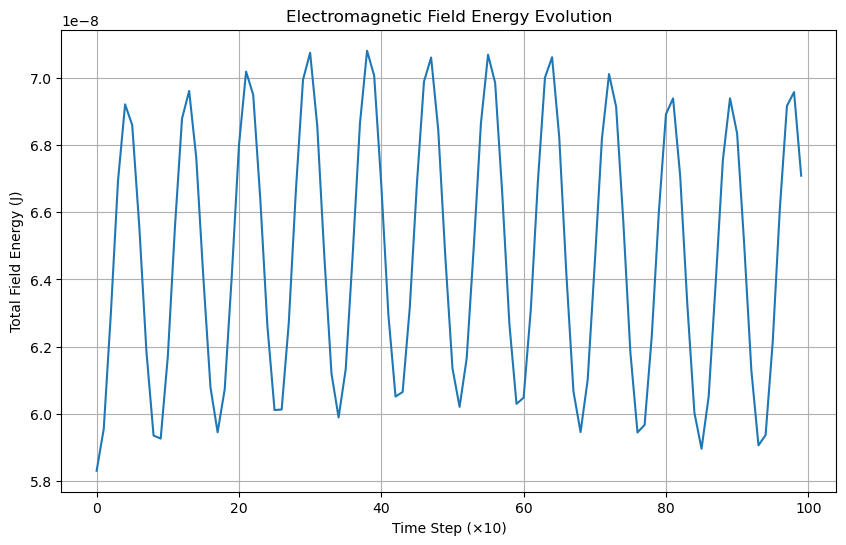

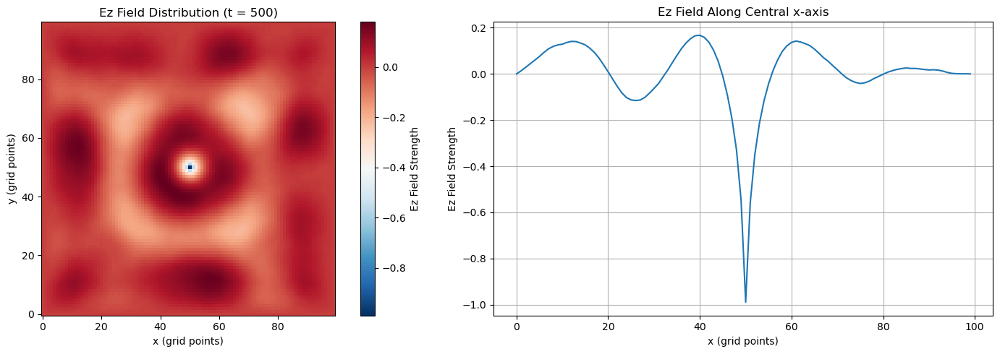

In [10]:
vis.plot_field_energy()
vis.plot_field_snapshot(sim.Ez, time_step=500)

1. Wave Propagation
   - Phase velocity in different media
   - Group velocity and dispersion
   - Wavelength and frequency relationships
   - Wave impedance (E/H ratio)

2. Material Interactions
   - Reflection and transmission at interfaces
   - Dielectric polarization
   - Wave impedance matching/mismatching
   - Standing waves in cavities

3. Boundary Effects
   - PML (Perfectly Matched Layer) absorption
   - Perfect Electric Conductor (PEC) boundaries
   - Total internal reflection
   - Evanescent waves

4. Energy Conservation
   - Poynting vector calculation
   - Field energy density
   - Power flow analysis

In [15]:
class EMAnalyzer:
    """
    Class for analyzing electromagnetic field simulations.
    """
    def __init__(self, sim):
        self.sim = sim

    def calculate_phase_velocity(self):
        """
        Calculate the phase velocity of the wave in the medium.
        """
        return self.sim.c / np.sqrt(np.max(self.sim.epsilon_r))

    def calculate_wave_impedance(self):
        """
        Calculate the wave impedance of the medium.
        """
        return np.sqrt(self.sim.mu_0 / self.sim.epsilon_0 * self.sim.mu_r / self.sim.epsilon_r)

    def calculate_poynting_vector(self):
        """
        Calculate the Poynting vector (power flow) in the medium.
        """
        Sx = self.sim.Ez * self.sim.Hy
        Sy = -self.sim.Ez * self.sim.Hx
        return Sx, Sy


In [22]:
def visualize_results(sim):
    """
    Visualize the electromagnetic field simulations with clear and enhanced plots.
    """
    analyzer = EMAnalyzer(sim)
    Sx, Sy = analyzer.calculate_poynting_vector()
    wave_impedance = analyzer.calculate_wave_impedance()

    # Visualization - Poynting Vector
    plt.figure(figsize=(12, 8))

    # Poynting Vector Plot
    plt.subplot(2, 1, 1)
    plt.plot(Sx, color='blue', linewidth=1.5)
    plt.plot(Sy, color='green', linestyle='--', linewidth=1.5)
    plt.title('Poynting Vector (Power Flow)', fontsize=16)
    plt.xlabel('Position Index', fontsize=12)
    plt.ylabel('Power Flow', fontsize=12)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True)

    # Wave Impedance Plot
    plt.subplot(2, 1, 2)
    plt.plot(wave_impedance, color='red', linewidth=1.5)
    plt.title('Wave Impedance Across Medium', fontsize=16)
    plt.xlabel('Position Index', fontsize=12)
    plt.ylabel('Impedance (Ohms)', fontsize=12)
    plt.legend(loc='upper right', fontsize=10)
    plt.grid(True)

    plt.tight_layout()
    plt.show()


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


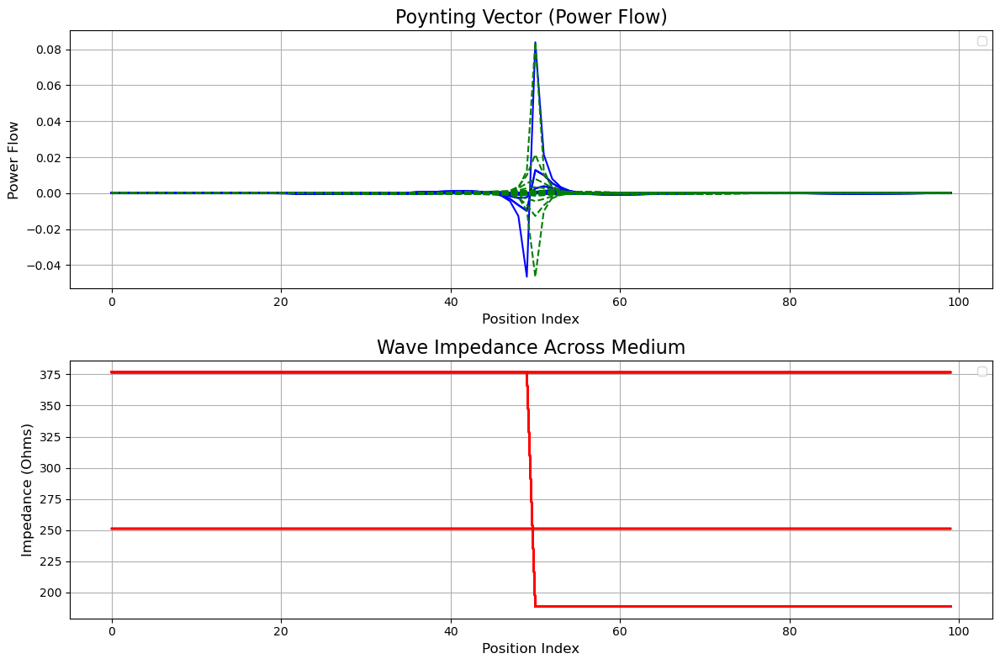

In [23]:
visualize_results(sim)


In [18]:
def advanced_simulation_examples():
    """
    Run advanced electromagnetic wave simulations for waveguides, cavities, and metamaterials.
    """
    # Waveguide Simulation
    sim_waveguide = EMSimulation(nx=200, ny=200, nt=1000)
    sim_waveguide.add_waveguide(width=20, epsilon_r=2.25)
    Ez_history_waveguide = sim_waveguide.simulate('sine')
    vis_waveguide = EMVisualizer(sim_waveguide)
    ani_waveguide = vis_waveguide.create_field_animation(Ez_history_waveguide)

    # Resonant Cavity Simulation
    sim_cavity = EMSimulation(nx=200, ny=200, nt=1000)
    sim_cavity.add_dielectric_block(80, 120, 80, 120, epsilon_r=4.0)
    Ez_history_cavity = sim_cavity.simulate('gaussian')
    vis_cavity = EMVisualizer(sim_cavity)
    ani_cavity = vis_cavity.create_field_animation(Ez_history_cavity)

    # Metamaterial Simulation
    sim_metamaterial = EMSimulation(nx=200, ny=200, nt=1000)
    sim_metamaterial.add_dielectric_block(50, 100, 50, 100, epsilon_r=4.0)
    sim_metamaterial.add_waveguide(width=20, epsilon_r=2.25)
    Ez_history_metamaterial = sim_metamaterial.simulate('gaussian')
    vis_metamaterial = EMVisualizer(sim_metamaterial)
    ani_metamaterial = vis_metamaterial.create_field_animation(Ez_history_metamaterial)

    return {
        'waveguide': ani_waveguide,
        'cavity': ani_cavity,
        'metamaterial': ani_metamaterial
    }

In [19]:
results = advanced_simulation_examples()

In [ ]:
# Save animations to MP4 to check if they are generated correctly
results['waveguide'].save('waveguide.mp4', writer='ffmpeg')
results['cavity'].save('cavity.mp4', writer='ffmpeg')
results['metamaterial'].save('metamaterial.mp4', writer='ffmpeg')